In [1]:
import scanpy as sc

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib as mpl

In [402]:
df=pd.read_csv('~/cellxgene/r100/FinalReport_PerCellAnalysis.csv')

In [403]:
df

,Cell No.,Nucleus location (X),Nucleus location (Y),Nucleus perimeter,ALD1AH1,KCNT2,HIGD1B,ALD1AH2,PDGFRB,CLDN5,...,KCNJ8,VEGFC,IL1R1,TAGLN,MFSD2A,RARA,TMEM132C,ACKR1,RGS16,MECOM
0,1,4708,444371,793.6,1,0,0,9,12,2,...,0,0,34,25,31,12,0,2,7,0
1,2,3630,447522,476.6,0,1,0,0,0,0,...,0,0,1,2,0,0,0,0,1,0
2,3,1519,444432,484.6,0,0,0,3,2,0,...,0,0,0,1,0,1,0,1,0,0
3,4,4602,447108,409.3,0,0,0,0,0,1,...,0,0,0,0,0,1,1,0,0,0
4,5,1062,444070,455.3,0,0,0,2,0,0,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31950,31951,40131,442639,184.4,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31951,31952,43825,441232,177.2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31952,31953,39627,441354,134.1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31953,31954,40360,441450,105.9,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [404]:
df.iloc[:,  :]
adata = sc.AnnData(df.iloc[:, 4:])
adata.obs = df.iloc[:,: 4]

/home/chang/miniconda3/envs/venv/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [405]:
adata.obs.columns = ['Cell No.', 'x_pos', 'y_pos', 'perimeter']

In [406]:
adata.obs['n_counts']  = adata.X.sum(axis=1)
adata.obs['n_genes'] = (adata.X > 0).sum(axis=1)

In [549]:
adata

AnnData object with n_obs × n_vars = 21239 × 18
    obs: 'Cell No.', 'x_pos', 'y_pos', 'perimeter', 'n_counts', 'n_genes', 'log_counts'

In [408]:
adata=adata[adata.obs.n_counts != 0 ]

In [409]:
adata.obs['log_counts'] = np.log10(adata.obs['n_counts'])

Trying to set attribute `.obs` of view, copying.
/home/chang/miniconda3/envs/venv/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [410]:
#adata.var_names
#sc.pl.violin(adata, keys=adata.var_names, rotation=45)

In [307]:
adata=adata[adata.obs['n_counts'] > 50]

In [31]:
adata = adata[adata.obs['perimeter'] < 1000]
adata

View of AnnData object with n_obs × n_vars = 21235 × 18
    obs: 'Cell No.', 'x_pos', 'y_pos', 'perimeter', 'n_counts', 'n_genes', 'log_counts'

In [411]:
adata2=adata[adata.obs['n_counts'] > 10]
adata2

View of AnnData object with n_obs × n_vars = 3799 × 18
    obs: 'Cell No.', 'x_pos', 'y_pos', 'perimeter', 'n_counts', 'n_genes', 'log_counts'

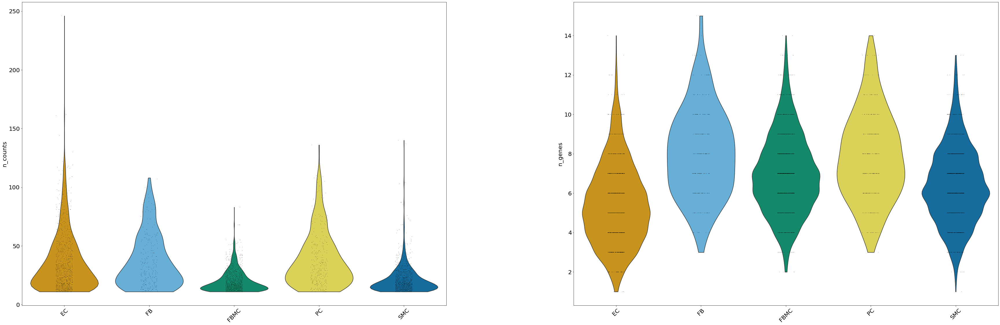

In [581]:
sc.pl.violin(adata2, keys=['n_counts','n_genes'], groupby='cell_type',rotation=45, save='cell_types.svg')

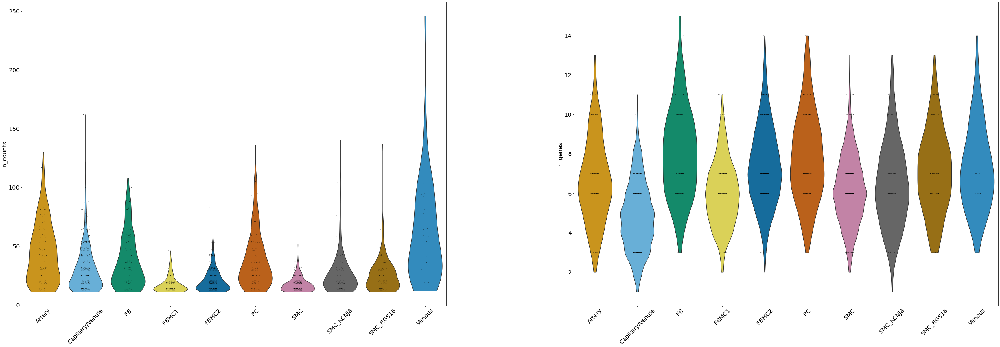

In [582]:
sc.pl.violin(adata2, keys=['n_counts','n_genes'], groupby='cell_type2',rotation=45, save='cell_types2.svg')

In [413]:
sc.pp.log1p(adata2)
sc.pp.scale(adata2)

/home/chang/miniconda3/envs/venv/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:375: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


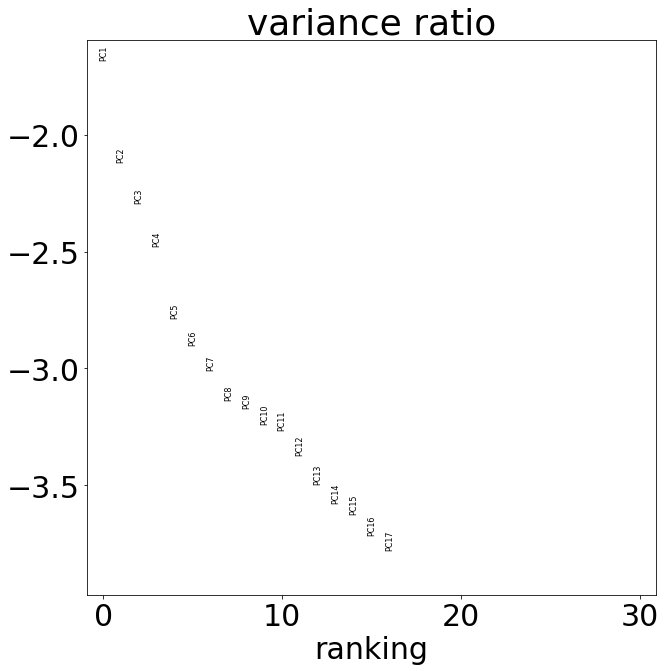

In [414]:
sc.tl.pca(adata2, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata2, log=True)

In [415]:
sc.pp.neighbors(adata2, n_neighbors=20, n_pcs=10)

In [438]:
sc.tl.leiden(adata2,
            resolution=.8)

In [417]:
sc.tl.umap(adata2)

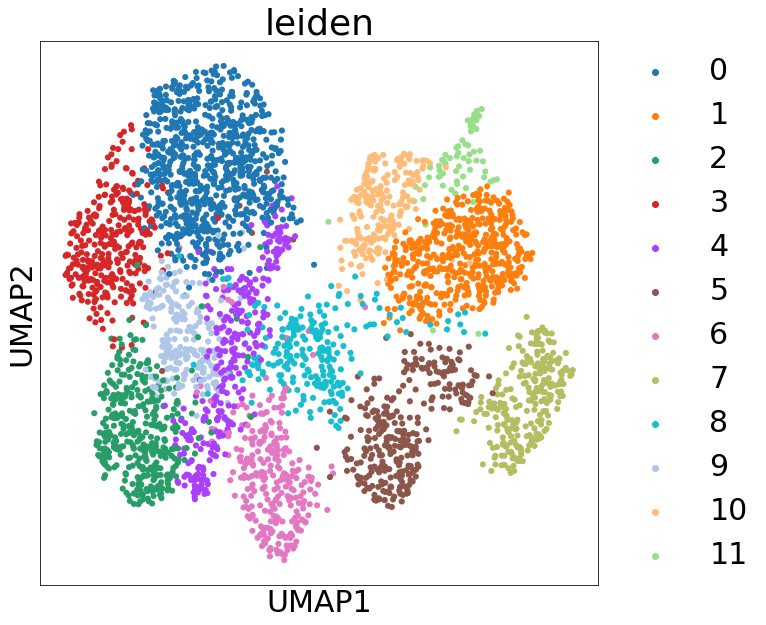

In [458]:
plt.rcParams['figure.figsize'] = 10, 10
plt.rcParams['font.size'] = 30

sc.pl.umap(adata2,
          color=['leiden'],
    size=150,
    ncols=4,
           add_outline=False
)

In [551]:
gene_list = adata.var_names.tolist()
gene_list#.append('spatial')
gene_list

['ALD1AH1',
 'KCNT2',
 'HIGD1B',
 'ALD1AH2',
 'PDGFRB',
 'CLDN5',
 'CCL19',
 'DCN',
 'KCNJ8',
 'VEGFC',
 'IL1R1',
 'TAGLN',
 'MFSD2A',
 'RARA',
 'TMEM132C',
 'ACKR1',
 'RGS16',
 'MECOM']

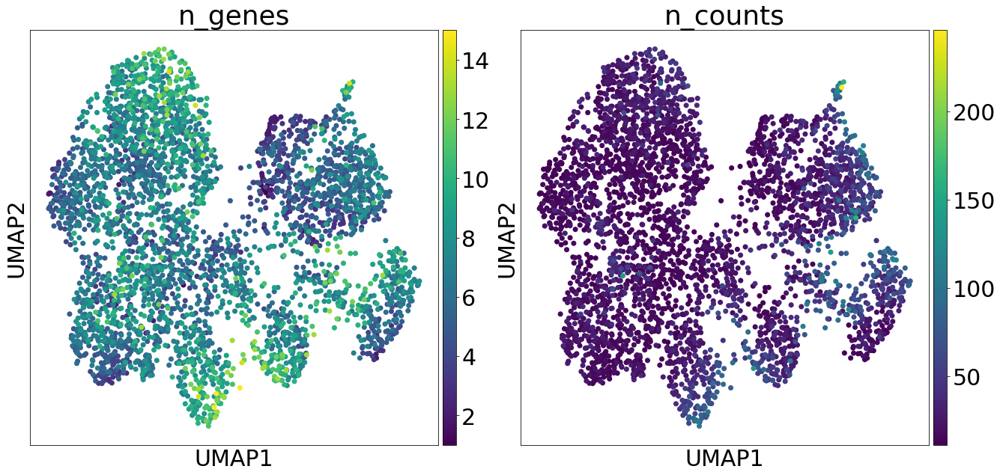

In [420]:
sc.pl.umap(adata2,
    color=['n_genes','n_counts'],
    size=200,
    ncols=2,)

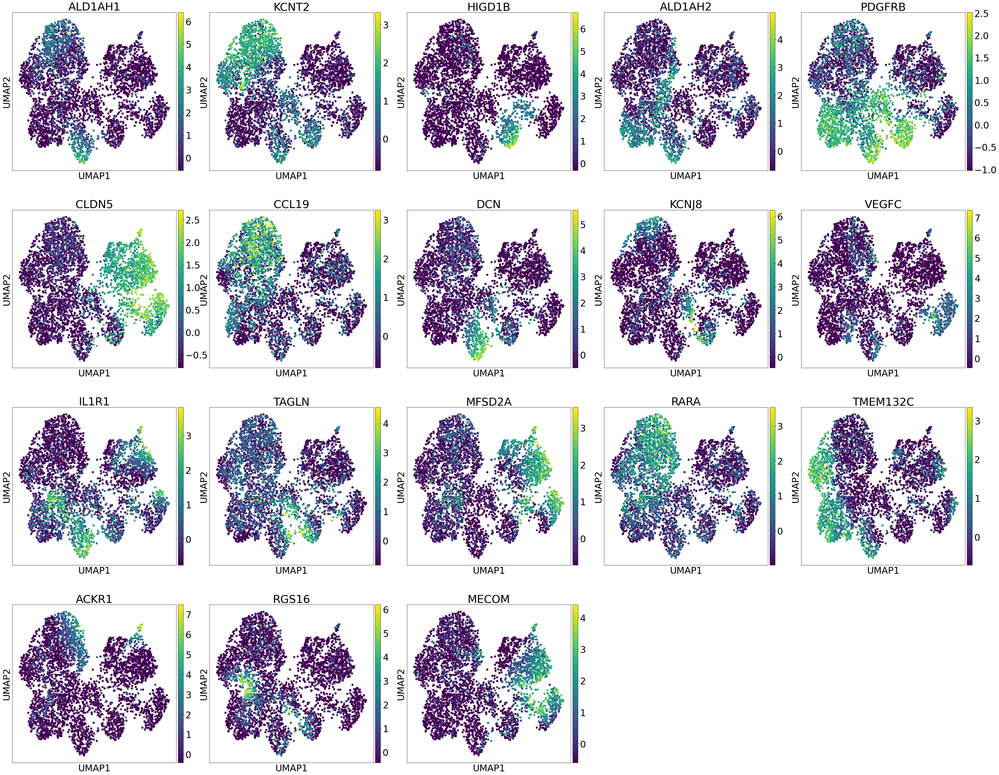

In [554]:
plt.rcParams['figure.figsize'] = 10, 10
plt.rcParams['font.size'] = 30


sc.pl.umap(adata2,
    color=gene_list,
    size=200,
    ncols=5,
    save='control_feature_umap.svg'
    #color_map = mpl.cm.cividis
)

In [498]:
old_to_new = {
    '0':'FBMC',
    '1':'EC',
    '2':'SMC',
    '3':'FBMC',
    '4':'SMC',
    '5':'PC',
    '6':'FB',
    '7':'EC',
    '8':'SMC',
    '9':'SMC',
    '10':"EC",
    '11':"EC"
}
old_to_new2 = {
    '0':'FBMC2',
    '1':'Capillary/Venule',
    '2':'SMC',
    '3':'FBMC1',
    '4':'SMC',
    '5':'PC',
    '6':'FB',
    '7':'Artery',
    '8':'SMC_KCNJ8',
    '9':'SMC_RGS16',
    '10':"Capillary/Venule",
    '11':"Venous"
}
adata2.obs['cell_type'] = (
    adata2.obs['leiden']
    .map(old_to_new)
    .astype('category')
)
adata2.obs['cell_type2'] = (
    adata2.obs['leiden']
    .map(old_to_new2)
    .astype('category')
)
adata2.uns['cell_type_colors'] = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2"]
adata2.uns['cell_type2_colors'] = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#666666", "#AD7700", "#1C91D4"]

... storing 'color' as categorical


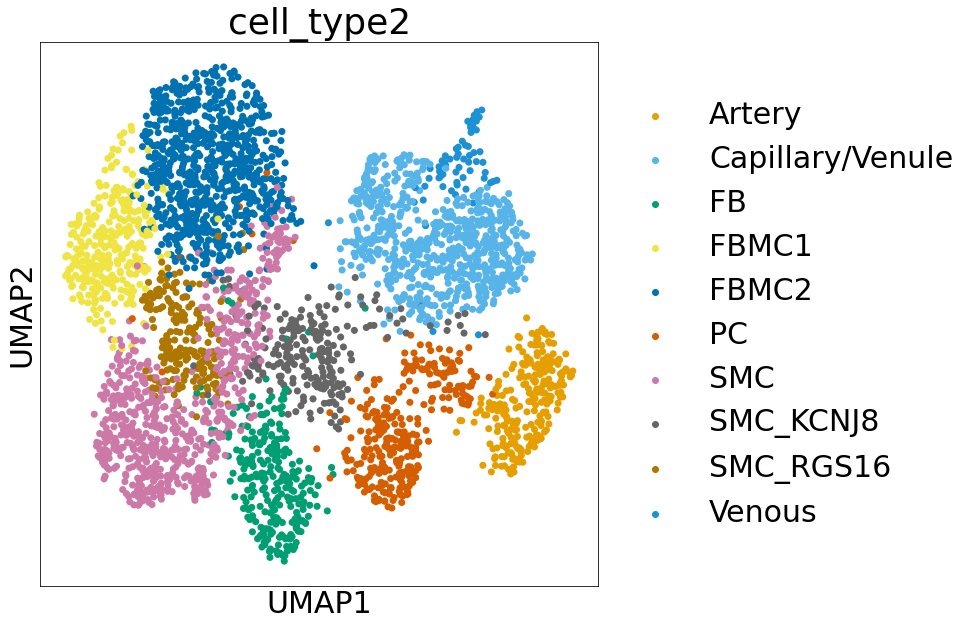

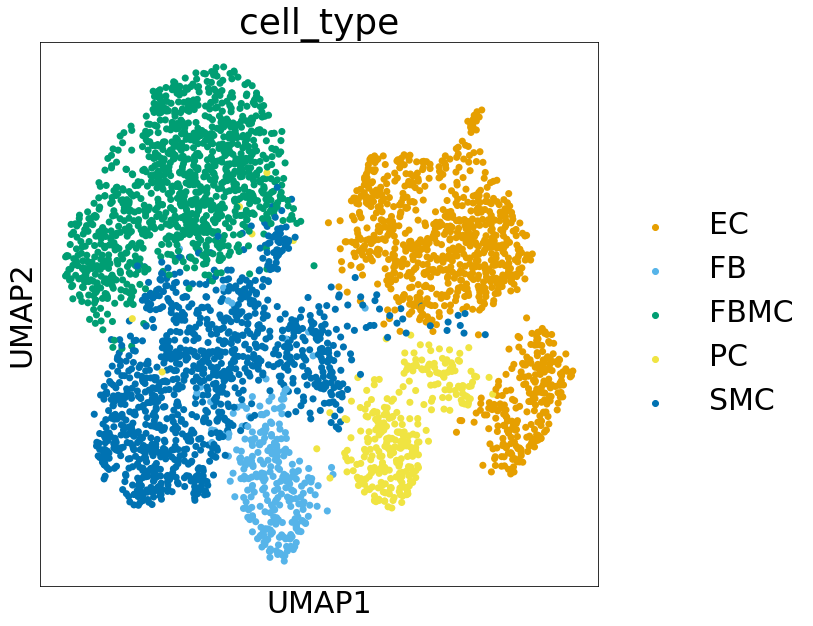

In [507]:
plt.rcParams['figure.figsize'] = 10, 10
plt.rcParams['font.size'] = 30


sc.pl.umap(adata2,
    color=['cell_type2'],
    size=200,
    #       add_outline=True
          # vmax=10,
)
sc.pl.umap(adata2,
    color=['cell_type'],
    size=200,
    #       add_outline=True
          # vmax=10,
)

In [503]:
df=pd.DataFrame(adata2.uns['cell_type_colors'],columns=['color'])
df['cell_type'] = adata2.obs.cell_type.cat.categories
df2 = pd.DataFrame(adata2.obs.cell_type)
df2=df2.merge(df, on='cell_type', how='left')
df2.index = adata2.obs.index
adata2.obs['color'] = df2['color']

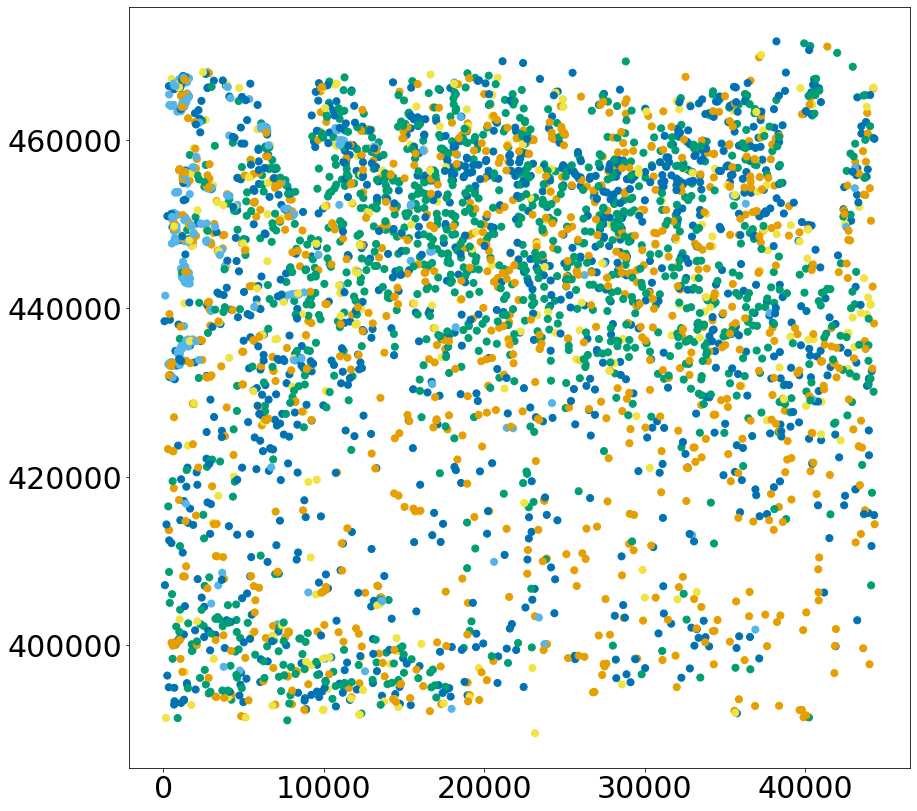

In [504]:
plt.figure(figsize=[14,14])

plt.scatter(x=adata2.obs.x_pos,
            y=adata2.obs.y_pos,
             c=adata2.obs.color,
            s=50,
           )

In [505]:
df=pd.DataFrame(adata2.uns['cell_type2_colors'],columns=['color'])
df['cell_type2'] = adata2.obs.cell_type2.cat.categories
df2 = pd.DataFrame(adata2.obs.cell_type2)
df2=df2.merge(df, on='cell_type2', how='left')
df2.index = adata2.obs.index
adata2.obs['color'] = df2['color']

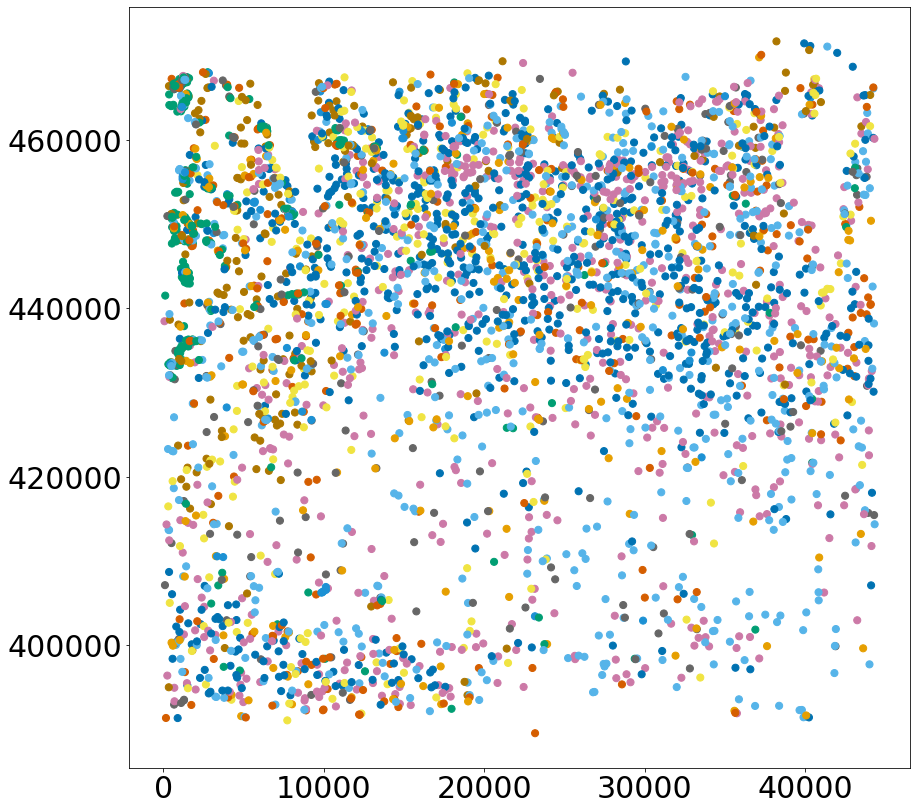

In [506]:
plt.figure(figsize=[14,14])


plt.scatter(x=adata2.obs.x_pos,
            y=adata2.obs.y_pos,
             c=adata2.obs.color,
            s=50,
           )

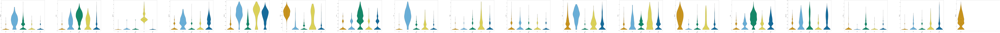

In [574]:
sc.pl.violin(adata2, keys=adata.var_names,groupby='cell_type', rotation=45)

In [590]:
adata2.var_names

Index(['ALD1AH1', 'KCNT2', 'HIGD1B', 'ALD1AH2', 'PDGFRB', 'CLDN5', 'CCL19',
       'DCN', 'KCNJ8', 'VEGFC', 'IL1R1', 'TAGLN', 'MFSD2A', 'RARA', 'TMEM132C',
       'ACKR1', 'RGS16', 'MECOM'],
      dtype='object')

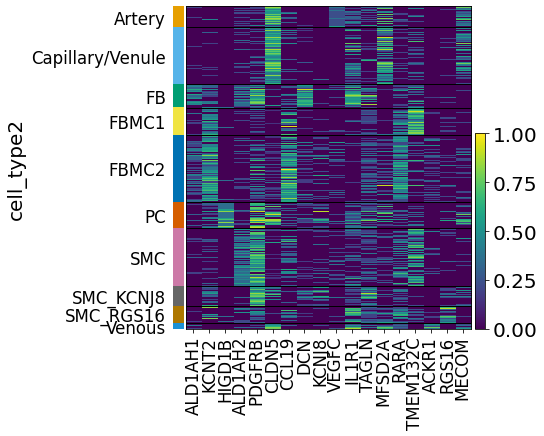

In [509]:
plt.rcParams['figure.figsize'] = 20, 20
plt.rcParams['font.size'] = 20
sc.pl.heatmap(adata2, adata2.var_names, groupby='cell_type2', swap_axes=False, standard_scale='var')

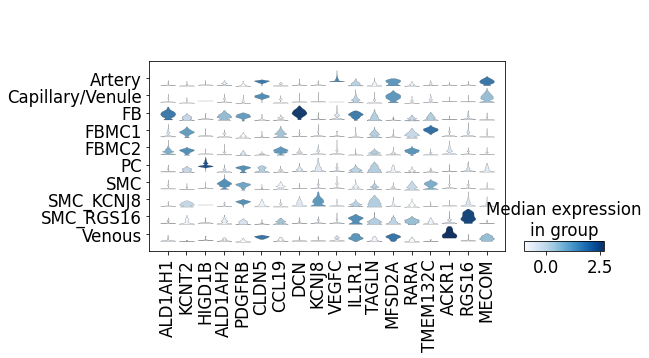

In [510]:
plt.rcParams['figure.figsize'] = 20, 20
plt.rcParams['font.size'] = 20
sc.pl.stacked_violin(adata2, adata2.var_names, groupby='cell_type2')

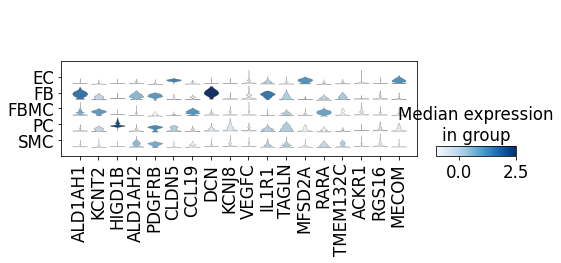

In [511]:
plt.rcParams['figure.figsize'] = 20, 20
plt.rcParams['font.size'] = 20
sc.pl.stacked_violin(adata2, adata2.var_names, groupby='cell_type')

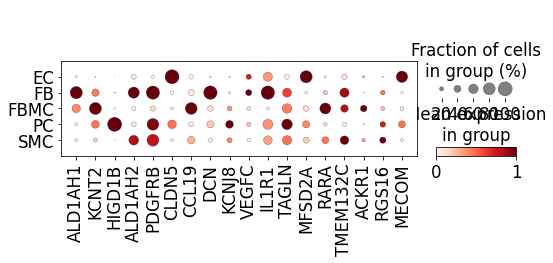

In [512]:
plt.rcParams['figure.figsize'] = 20, 20
plt.rcParams['font.size'] = 20
sc.pl.dotplot(adata2, adata2.var_names, groupby='cell_type', standard_scale='var')

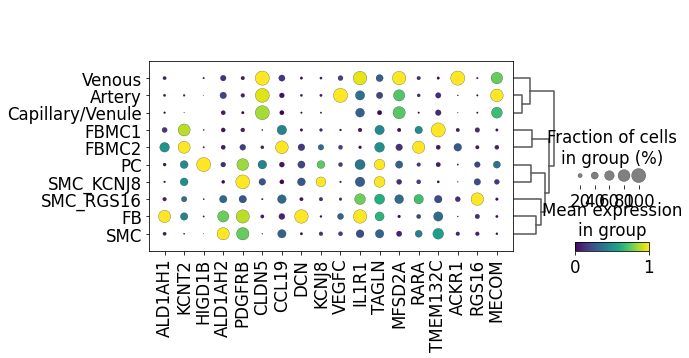

In [571]:
plt.rcParams['figure.figsize'] = 20, 20
plt.rcParams['font.size'] = 20
sc.tl.dendrogram(adata2, groupby='cell_type2')
sc.pl.dotplot(adata2, adata2.var_names, groupby='cell_type2', standard_scale='var', dendrogram=True, save='dendro_sub.svg', cmap = 'viridis')

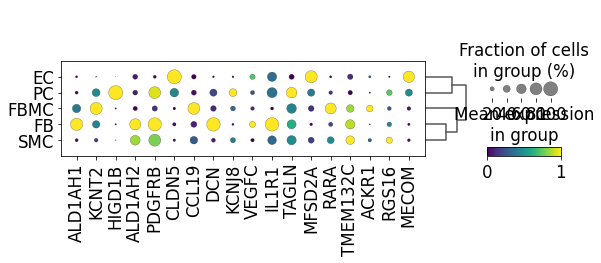

In [572]:
plt.rcParams['figure.figsize'] = 20, 20
plt.rcParams['font.size'] = 20
sc.tl.dendrogram(adata2, groupby='cell_type')
sc.pl.dotplot(adata2, adata2.var_names, groupby='cell_type', standard_scale='var', dendrogram=True,categories_order=['EC', 'PC', 'SMC', 'FB', 'FBMC'], save='dendro_cell.svg', cmap = 'viridis')

In [470]:
subset = adata2[adata2.obs['cell_type2'].isin(["Venous","Artery","Capillary/Venule"])]
#df=pd.DataFrame(subset.uns['cell_type2_colors'],columns=['color'])
#df['cell_type2'] = subset.obs.cell_type2.cat.categories
df2 = pd.DataFrame(subset.obs.cell_type2)
#df2=df2.merge(df, on='cell_type2', how='left')

In [595]:
#sns.kdeplot(x=subset.obs.x_pos, fill=True,alpha=.5, linewidth=0, 
            #y=subset.obs.y_pos, data=df2, levels=[.05,.1,.2,.3,.4,.5,.6,.7,.8,.9,1],
            #hue='cell_type2')

In [596]:
#sns.kdeplot(x=subset.obs.x_pos, fill=True,alpha=.5, linewidth=0, 
            #y=subset.obs.y_pos, data=df2,
            #hue='cell_type2')